In [ ]:
#comando para detecção em imagens de uma pasta
!python detect.py --source imagens --conf 0.1 --iou 0.5 --device cpu --weights 'pesos/yolov9-m-converted.pt' --name placas

# Treinamento
Antes do treinamento precisamos colocar aqui no repositório as pastas de *Treino*, *Teste* e *Validação* contendo os rótulos e as imagens feitas na parte 1 do trabalho.

In [ ]:
# Verificação se a GPU está disponível (foi necessário pois em meu computador não funcionava pela placa ser AMD)
# No notebook tive um pouco de dificuldade em selecionar a GPU dedicada ao invés da integrada
import torch

print(torch.cuda.is_available(), torch.version.cuda, torch.__version__)

True 11.8 2.7.1+cu118


### Chamada do Treinamento

O comando de exemplo para treinamento é esse:
```bash
!python3 train_dual.py  \                       # Executa o script de treinamento
    --workers 8 \                               # Define 8 processos paralelos para carregar as imagens
    --device 0 \                                # Utiliza a GPU 0 (primeira disponível)
    --batch-size 2 \                            # Treina com 2 imagens por iteração (aumentar consome mais VRAM)
    --data data/Dados-Placas.yaml \             # Arquivo YAML com o caminho para o dataset
    --img 640 \                                 # Redimensiona todas as imagens para resolução 640x640
    --cfg modelos/yolov9-c.yaml \               # Define a arquitetura do modelo (Nesse caso yolov9)
    --weights '' \                              # Começa o treinamento do zero, sem pesos pré-treinados
    --name detector_placas \                    # Cria uma pasta com logs, pesos e resultados
    --hyp modelos/hyp.scratch-high.yaml \       # Arquivo de hiperparâmetros
    --noplots                                   # Evita gráficos automáticos no final

```

O que podemos ficar atentos nisso são:
- ***Weights***: Estão zerados, representando que o modelo deve ser treinado do zero, sem pesos pré definidos.
- ***batch-size***, ***workers*** e ***img***: Pois minha placa de vídeo é de 16GB então é possível aumentar alguns desses parâmetros.
- ***data***: Devemos modificar o arquivo `YAML` para pegar nossas imagens corretamente.
- ***hyp***: Deve ser necessário ir alterando e testando alguns hyperparâmetros durante os testes, para chegarmos em um melhor resultado.

Também existem outros parâmetros além desses, fica a nosso critério entender e utilizar deles.

### Arquivo YAML


Foi criado um novo arquivo `data/placas.yaml` para localizar corretamente nossas imagens, nele existe:
```yaml
# Localização das imagens
train: data/labels/train
val: data/labels/val
test: data/labels/test

nc: 35  # Numero de classes

names: [0,1,2,3,4,5,6,7,8,9,A,B,C,D,E,F,G,H,I,J,K,L,M,N,P,Q,R,S,T,U,V,W,X,Y,Z] # classes
``` 

### Hyperparâmetros

Os hyperparametros de cada teste estão localizados em `data/hyps`, eles setam diversas 'configurações' do treinamento. Para cada treinamento estamos utilizando hyps diferentes, desse modo podemos ir testando modelos de modo que não precisamos retirar mais fotos.

Há uma quantidade considerável de hyperparâmetros nos arquivos, então não vou ditar aqui o que cada um deles faz a princípio, depois posso fazer isso. Caso queira adiantar, dentro dos arquivos há anotações que foram criadas.

###  Modelos

Os modelos são categorizados com T sendo o meno e E sendo o maior (acho que segue a lógica de Tiny, small, medium, large e extra), sendo o menor menos preciso e o maior mais preciso, mas com maior custo computacional.

Os modelos se localizam na pasta `models/detect`, deve-se trocar o NC para 35 em todas elas.

## Treinamentos diferentes

In [ ]:
#comando para TREINAR uma rede conforme os parametros passados
import os

# Essas linhas desativam o acompanhamento de métricas do treinamento online, então evitam erros/logins
os.environ["WANDB_MODE"] = "disabled"
os.environ["WANDB_DISABLED"] = "true"

# Chamada do código que treinará o modelo
!python train_dual.py --data data/placas.yaml --cfg models/detect/yolov9-s.yaml --imgsz 640 --epochs 100 --hyp data/hyps/hyp.ocr-placas.yaml --batch-size 8 --device 0 --project runs/placas --name v9s-placas --cache ram

In [19]:
import os

os.environ["WANDB_MODE"] = "disabled"
os.environ["WANDB_DISABLED"] = "true"

# Teste 2
!python train_dual.py --data data/placas.yaml --cfg models/detect/yolov9-s.yaml --imgsz 640 --epochs 200 --hyp data/hyps/hyp.ocr-placas2.yaml --batch-size 8 --device 0 --workers 2 --weights '' --project runs/placas --name v9s-placas_2hyp --cache ram --close-mosaic 15 --image-weights


c:\Users\Klovys\OneDrive\Documentos\Faculdade\8-Semestre\yolov9\utils\general.py:29: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  import pkg_resources as pkg
train_dual: weights='', cfg=models/detect/yolov9-s.yaml, data=data/placas.yaml, hyp=data/hyps/hyp.ocr-placas2.yaml, epochs=200, batch_size=8, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=True, device=0, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=2, project=runs/placas, name=v9s-placas_2hyp, exist_ok=False, quad=False, cos_lr=False, flat_cos_lr=False, fixed_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, min_items=0, close_mosaic=15, entity=None, upload_datas

In [ ]:
import os

os.environ["WANDB_MODE"] = "disabled"
os.environ["WANDB_DISABLED"] = "true"

# Treino 3
!python train_dual.py --device 0 --batch-size 8 --workers 2 --img 640 --data data/placas.yaml --cfg models/detect/yolov9-s.yaml --weights "" --hyp data/hyps/hyp.ocr-placas3.yaml --epochs 200 --patience 30 --close-mosaic 15 --rect --cache disk --project runs/placas --name v9s-placas_3hyp3

In [ ]:
import os

os.environ["WANDB_MODE"] = "disabled"
os.environ["WANDB_DISABLED"] = "true"

# Treino 4
!python train_dual.py --device 0 --batch-size 8 --workers 2 --img 640 --data data/placas.yaml --cfg models/detect/yolov9-s.yaml --weights '' --hyp data/hyps/hyp.ocr-placas4.yaml --epochs 400 --patience 60 --close-mosaic 15 --cache disk --cos-lr --project runs/placas --name v9s-placas_4hyp --label-smoothing 0.03

In [ ]:
import os

os.environ["WANDB_MODE"] = "disabled"
os.environ["WANDB_DISABLED"] = "true"

# Treino 5
!python train_dual.py --device 0 --batch-size 8 --workers 2 --img 640 --data data/placas.yaml --cfg models/detect/yolov9-s.yaml --weights '' --hyp data/hyps/hyp.ocr-placas5.yaml --epochs 500 --patience 80 --close-mosaic 20 --cache disk --cos-lr --label-smoothing 0.05 --project runs/placas --name v9s-placas_5hyp

c:\Users\Klovys\OneDrive\Documentos\Faculdade\8-Semestre\yolov9\utils\general.py:29: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  import pkg_resources as pkg
train_dual: weights='', cfg=models/detect/yolov9-s.yaml, data=data/placas.yaml, hyp=data/hyps/hyp.ocr-placas5.yaml, epochs=500, batch_size=8, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=disk, image_weights=False, device=0, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=2, project=runs/placas, name=v9s-placas_5hyp, exist_ok=False, quad=False, cos_lr=True, flat_cos_lr=False, fixed_lr=False, label_smoothing=0.05, patience=80, freeze=[0], save_period=-1, seed=0, local_rank=-1, min_items=0, close_mosaic=20, entity=None, upload_data

In [ ]:
import torch, numpy as np

torch.serialization.add_safe_globals([np.core.multiarray._reconstruct])
p='runs/placas/v9s-placas_5hyp2/weights/best.pt'
ck=torch.load(p, map_location='cpu', weights_only=False)
torch.save(ck, p.replace('.pt','_converted.pt'))
print('✅ convertido:', p.replace('.pt','_converted.pt'))

In [ ]:
import torch, numpy
torch.serialization.add_safe_globals([numpy._core.multiarray._reconstruct])
orig_load = torch.load
def safe_load(*a, **k):
    k["weights_only"] = False
    return orig_load(*a, **k)
torch.load = safe_load
import runpy, sys, os
sys.argv = [
    "train_dual.py",
    "--device", "0",
    "--batch-size", "10",
    "--workers", "2",
    "--img", "704",
    "--data", "data/placas.yaml",
    "--cfg", "models/detect/yolov9-s.yaml",
    "--weights", "runs/placas/v9s-placas_5hyp2/weights/best_converted.pt",
    "--hyp", "data/hyps/hyp.ocr-placas6.yaml",
    "--epochs", "150",
    "--patience", "50",
    "--cos-lr",
    "--label-smoothing", "0.07",
    "--project", "runs/placas",
    "--name", "v9s-placas_b10_704_finetune"
]

# Treino 6 (com finetunning)
runpy.run_module("train_dual", run_name="__main__")

c:\Users\Klovys\OneDrive\Documentos\Faculdade\8-Semestre\yolov9\utils\general.py:29: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  import pkg_resources as pkg
train_dual: weights=runs/placas/v9s-placas_5hyp2/weights/best_converted.pt, cfg=models/detect/yolov9-s.yaml, data=data/placas.yaml, hyp=data/hyps/hyp.ocr-placas6.yaml, epochs=150, batch_size=10, imgsz=704, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=0, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=2, project=runs/placas, name=v9s-placas_b10_704_finetune, exist_ok=False, quad=False, cos_lr=True, flat_cos_lr=False, fixed_lr=False, label_smoothing=0.07, patience=50, freeze=[0], save_period=-1, seed=0, loca

{'__name__': '__main__',
 '__file__': 'c:\\Users\\Klovys\\OneDrive\\Documentos\\Faculdade\\8-Semestre\\yolov9\\train_dual.py',
 '__cached__': 'c:\\Users\\Klovys\\OneDrive\\Documentos\\Faculdade\\8-Semestre\\yolov9\\__pycache__\\train_dual.cpython-313.pyc',
 '__doc__': None,
 '__loader__': <_frozen_importlib_external.SourceFileLoader at 0x2c871bdbdd0>,
 '__package__': '',
 '__spec__': ModuleSpec(name='train_dual', loader=<_frozen_importlib_external.SourceFileLoader object at 0x000002C871BDBDD0>, origin='c:\\Users\\Klovys\\OneDrive\\Documentos\\Faculdade\\8-Semestre\\yolov9\\train_dual.py'),
 '__builtins__': {'__name__': 'builtins',
  '__doc__': "Built-in functions, types, exceptions, and other objects.\n\nThis module provides direct access to all 'built-in'\nidentifiers of Python; for example, builtins.len is\nthe full name for the built-in function len().\n\nThis module is not normally accessed explicitly by most\napplications, but can be useful in modules that provide\nobjects with th

In [ ]:
import os

os.environ["WANDB_MODE"] = "disabled"
os.environ["WANDB_DISABLED"] = "true"

# Treino 8
!python train_dual.py --device 0 --batch-size 8 --workers 2 --img 704 --data data/placas.yaml --cfg models/detect/yolov9-m.yaml --weights '' --hyp data/hyps/hyp.ocr-placas8.yaml --epochs 450 --patience 80 --cos-lr --close-mosaic 30 --label-smoothing 0.06 --cache disk --project runs/placas --name v9m-placas_hyp8
# Parei no meio por demorar demais


^C


In [ ]:
import os

os.environ["WANDB_MODE"] = "disabled"
os.environ["WANDB_DISABLED"] = "true"
# Treino 9
!python train_dual.py --device 0 --batch-size 8 --workers 4 --img 640 --data data/placas.yaml --cfg models/detect/yolov9-m.yaml --weights '' --hyp data/hyps/hyp.ocr-placas6.yaml --epochs 120 --patience 25 --rect --cache disk --close-mosaic 10 --cos-lr --label-smoothing 0.06 --project runs/placas --name v9m-placas_hyp9


^C


In [13]:
# Navegar para a pasta
cd "c:\Users\Gabriel\Downloads\yolov9-treinamento-jairo-main\yolov9-treinamento-jairo-main"

# Ativar ambiente virtual
.venv\Scripts\activate

# Desinstalar PyTorch
pip uninstall torch torchvision torchaudio -y

# Instalar PyTorch com CUDA 13.0
pip install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu130

# Verificar instalação
python -c "import torch; print(f'CUDA: {torch.cuda.is_available()}'); print(f'GPU: {torch.cuda.get_device_name(0) if torch.cuda.is_available() else \"NONE\"}')"

SyntaxError: (unicode error) 'unicodeescape' codec can't decode bytes in position 2-3: truncated \UXXXXXXXX escape (1959208450.py, line 2)

In [ ]:
import os

os.environ["WANDB_MODE"] = "disabled"
os.environ["WANDB_DISABLED"] = "true"

# Treino 5
!python train_dual.py --device 0 --batch-size 4 --workers 1 --img 640 --data data/placas.yaml --cfg models/detect/yolov9-m.yaml --weights '' --hyp data/hyps/hyp.ocr-placas5.yaml --epochs 400 --patience 150 --close-mosaic 100 --cache disk --cos-lr --label-smoothing 0.07 --project runs/placas --name v9m-placas_fromscratch_v6 --save-period 10

^C


# Métricas de Validação

Esse script serve para identificar e validar qual função realmente calcula o **mAP (mean Average Precision)** e as demais métricas de desempenho no seu código YOLOv9.  
Ele deve retornar informações de diagnóstico (nomes de funções, chamadas e trechos de código) e, se o teste rodar até o fim, valores de mAP simulados ou logs de sucesso na validação.


In [8]:
!python val_dual.py --data data/placas.yaml --weights runs/placas/v9m-placas_hyp9/weights/best.pt --img 640 --device 0

^C


In [1]:
!python val_dual.py --data data/placas.yaml --weights runs/placas/v9m-placas_hyp8/weights/best.pt --img 704 --device 0 --workers 2

c:\Users\Klovys\OneDrive\Documentos\Faculdade\8-Semestre\yolov9\utils\general.py:29: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  import pkg_resources as pkg
val_dual: data=data/placas.yaml, weights=['runs/placas/v9m-placas_hyp8/weights/best.pt'], batch_size=32, imgsz=704, conf_thres=0.001, iou_thres=0.7, max_det=300, task=val, device=0, workers=2, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs\val, name=exp, exist_ok=False, half=False, dnn=False, min_items=0
YOLO  v0.1-104-g5b1ea9a Python-3.13.7 torch-2.7.1+cu118 CUDA:0 (NVIDIA GeForce RTX 3050 6GB Laptop GPU, 6144MiB)

Fusing layers... 
yolov9-m summary: 588 layers, 32602330 parameters, 0 gradients, 131.0 GFLOPs

val: Scanning C:\Users\Klovys\OneDrive\Docum

# Minhas dúvidas

1. Utilizar esse método de treinamento que estou utilizando é o correto? Testando diferentes parâmetros e hyp apenas para rodar algumas vezes com o yolov9? (Simmm, pode continuar desse jeito. Ele só vai querer o arquivo 'weights' da melhor run pra testar, o resto fds)
1. O código de buscar as métricas de validação que estão predefinidas nesse notebook que o professor disponibilizou é realmente necessário? Não estou o utilizando pois valido diretamente com `!python val_dual.py ...`...
1. No pdf do trabalho está pedindo apresentação, artigo e funcionamento. Lembro na aula dele ter falado que a nota vai variar de acordo com a % de aerto do modelo, mas no pdf está diferente. Acho bom checar com ele os métodos de avaliação

    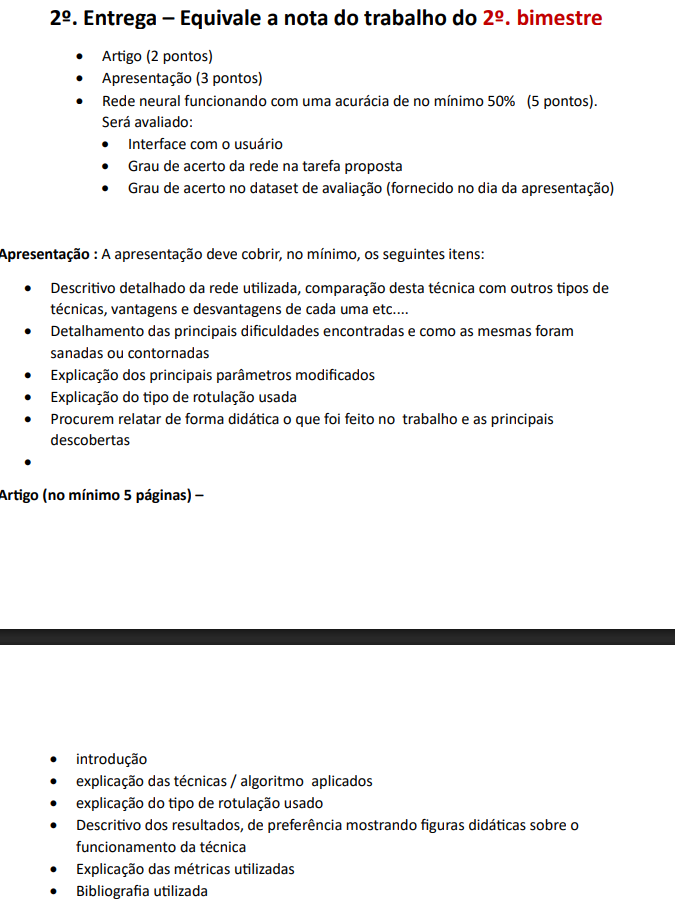